In [2]:
import torchvision
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import torch
import torch.nn.functional as F
from torch import nn
from torch.utils.data import random_split, DataLoader
import plotly.graph_objects as go

In [3]:
generator=torch.Generator().manual_seed(23)


# Dataset

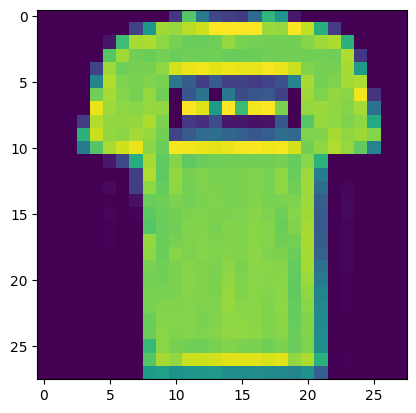

In [4]:
root = './FMNIST/'
dataset = torchvision.datasets.FashionMNIST(root = root, train = True, transform = transforms.ToTensor())
x= dataset.__getitem__(1)
plt.imshow(x[0].squeeze());

train_size=0.9*len(dataset)
val_size=0.1*len(dataset)
batch_size = 5
train_dataset, val_dataset = random_split(dataset, [int(train_size),int(val_size) ])
subset_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_loader=DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
validation_iter = iter(validation_loader)

In [5]:
for  sample in subset_loader:
    print(sample[0].shape)
    break

torch.Size([5, 1, 28, 28])


# Model

In [6]:
#conv 2d
batch_size=5
input_shape=(1,28,28)
kernel_size=3
padding=0
n_filters = 5
stride=1
out_shape_conv= int((((input_shape[1] - kernel_size )/stride )+ 1 ))
# maxpooling
pool_size=2
pool_stride=2
out_shape_maxpool=int((((out_shape_conv - pool_size )/pool_stride )+ 1 ))
# linear
input_size=845
inner_size=128
output_size=64
cat_size=10

class reference_conv(nn.Module):
    def __init__(self):
        super(reference_conv, self).__init__()
        self.conv2d=nn.Conv2d(in_channels=1, out_channels=n_filters, kernel_size=kernel_size, stride=stride,padding=padding)
        self.relu_1=nn.ReLU()
        self.maxpool=nn.MaxPool2d(kernel_size=pool_size, stride=pool_stride)
        self.flatten=nn.Flatten()
        self.linear_1=nn.Linear(in_features=input_size, out_features=inner_size)
        self.relu_2=nn.ReLU()
        self.linear_2=nn.Linear(in_features=inner_size, out_features=cat_size)
    
    def forward(self, x):
        #conv stack
        # print('input',x.shape)
        x=self.conv2d(x)
        # print('conv2d',x.shape)
        x=self.relu_1(x)
        # print('relu_1',x.shape)
        x=self.maxpool(x)
        # print('maxpool',x.shape)
        #flatten 
        x=self.flatten(x)
        # print('flatten',x.shape)
        #linear stack
        x=self.linear_1(x)
        # print('linear_1',x.shape)
        x=self.relu_2(x)
        # print('relu_2',x.shape)
        x=self.linear_2(x)
        # print('linear_2',x.shape)
        return x
    

In [7]:
model = reference_conv()
for p in model.parameters():
    p.requires_grad = True

model


reference_conv(
  (conv2d): Conv2d(1, 5, kernel_size=(3, 3), stride=(1, 1))
  (relu_1): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_1): Linear(in_features=845, out_features=128, bias=True)
  (relu_2): ReLU()
  (linear_2): Linear(in_features=128, out_features=10, bias=True)
)

In [21]:
model.forward(x[0].view(1,1,28,28))

input torch.Size([1, 1, 28, 28])
conv2d torch.Size([1, 5, 26, 26])
relu_1 torch.Size([1, 5, 26, 26])
maxpool torch.Size([1, 5, 13, 13])
flatten torch.Size([1, 845])
linear_1 torch.Size([1, 128])
relu_2 torch.Size([1, 128])
linear_2 torch.Size([1, 10])


tensor([[ 0.0181, -0.0944, -0.1623,  0.2090,  0.0320, -0.0336, -0.1867, -0.1288,
         -0.0341, -0.0168]], grad_fn=<AddmmBackward0>)

In [8]:
out_conv,out_relu1,out_lin1,out_relu2,out_lin2=[],[],[],[],[]
grad_conv,grad_relu1, grad_lin1,grad_relu2,grad_lin2=[],[],[],[],[]

def for_conv(module, act_input, output):
    out_conv.append(output.detach())
def back_conv(module, grad_input, grad_output):
    grad_conv.append(grad_output[0].detach())
conv_handle=model.conv2d.register_forward_hook(for_conv)
model.conv2d.register_full_backward_hook(back_conv)

def for_relu1(module, act_input, output):
    out_relu1.append(output.detach())
def back_relu1(module, grad_input, grad_output):
    grad_relu1.append(grad_output[0].detach())
relu1_handle=model.relu_1.register_forward_hook(for_relu1)
model.relu_1.register_full_backward_hook(back_relu1)

def for_lin1(module, act_input, output):
    out_lin1.append(output.detach())
def back_lin1(module, grad_input, grad_output):
    grad_lin1.append(grad_output[0].detach())
lin1_handle=model.linear_1.register_forward_hook(for_lin1)
model.linear_1.register_full_backward_hook(back_lin1)

def for_relu2(module, act_input, output):
    out_relu2.append(output.detach())
def back_relu2(module, grad_input, grad_output):
    grad_relu2.append(grad_output[0].detach())
relu2_handle=model.relu_2.register_forward_hook(for_relu2)
model.relu_2.register_full_backward_hook(back_relu2)

def for_lin2(module, act_input, output):
    out_lin2.append(output.detach())
def back_lin2(module, grad_input, grad_output):
    grad_lin2.append(grad_output[0].detach())
lin2_handle=model.linear_2.register_forward_hook(for_lin2)
model.linear_2.register_full_backward_hook(back_lin2)


for_handles=[conv_handle, relu1_handle,lin1_handle,relu2_handle,lin2_handle]

# Training


In [9]:
lr = 0.1
i=0
loss_steps = 500
loss_val_batches = 5


for batch_x, batch_y in subset_loader:
    #forward
    out = model.forward(batch_x)

    #loss
    loss = F.cross_entropy(out,batch_y)

    #clean grad
    for p in model.parameters():
        p.grad = None

    #calculate grad
    loss.backward()

    #update parameters
    for p in model.parameters():
        p.data += -lr*p.grad
        
    
    if i % 1000 == 0:
        for handle  in for_handles: 
            handle.remove()
        with torch.no_grad():
            
            losses=torch.zeros(loss_steps)
            for j in range(loss_val_batches):
                val_batch=next(validation_iter)
                val_samples=val_batch[0]
                val_truth=val_batch[1]
                # print(sample.shape)
                out_loss = out=model.forward(val_samples)
                losses[j] = F.cross_entropy(out_loss,val_truth)
            print(f'step = {i}, val loss over {loss_val_batches} batches = {losses.mean()}')

        #reatach forward hooks
        conv_handle=model.conv2d.register_forward_hook(for_conv)
        relu1_handle=model.relu_1.register_forward_hook(for_relu1)
        lin1_handle=model.linear_1.register_forward_hook(for_lin1)
        relu2_handle=model.relu_2.register_forward_hook(for_relu2)
        lin2_handle=model.linear_2.register_forward_hook(for_lin2)
        for_handles=[conv_handle, relu1_handle,lin1_handle,relu2_handle,lin2_handle]

    i+=1

step = 0, val loss over 5 batches = 0.022069936618208885
step = 1000, val loss over 5 batches = 0.006050969008356333
step = 2000, val loss over 5 batches = 0.004288617521524429
step = 3000, val loss over 5 batches = 0.0069313994608819485
step = 4000, val loss over 5 batches = 0.003194925608113408
step = 5000, val loss over 5 batches = 0.003325935686007142
step = 6000, val loss over 5 batches = 0.0030499761924147606
step = 7000, val loss over 5 batches = 0.005736810155212879
step = 8000, val loss over 5 batches = 0.005544816609472036
step = 9000, val loss over 5 batches = 0.002867812057957053
step = 10000, val loss over 5 batches = 0.002421478508040309


# Some Plotting

In [10]:
print(len(out_conv),len(out_relu1),len(out_lin1),len(out_relu2),len(out_lin2),len(grad_conv),len(grad_relu1),len(grad_lin1),len(grad_relu2),len(grad_lin2))
out_conv[0].shape,out_relu1[0].shape,out_lin1[0].shape,out_relu2[0].shape,out_lin2[0].shape,'-',grad_conv[0].shape,grad_relu1[0].shape,grad_lin1[0].shape,grad_relu2[0].shape,grad_lin2[0].shape

10800 10800 10800 10800 10800 10800 10800 10800 10800 10800


(torch.Size([5, 5, 26, 26]),
 torch.Size([5, 5, 26, 26]),
 torch.Size([5, 128]),
 torch.Size([5, 128]),
 torch.Size([5, 10]),
 '-',
 torch.Size([5, 5, 26, 26]),
 torch.Size([5, 5, 26, 26]),
 torch.Size([5, 128]),
 torch.Size([5, 128]),
 torch.Size([5, 10]))

In [11]:
out_t=[out_conv,out_relu1,out_lin1,out_relu2,out_lin2]
grad_t=[grad_conv,grad_relu1, grad_lin1,grad_relu2,grad_lin2]

In [12]:
# turn lists to tensors and normalize them into 2 dimensions 0 for step, 1 for values
def normalize_values(x):
    if x[0].dim() > 3:  #if we are in the convolution part of the network
        stacked= torch.stack(x,dim=0)
        # print(stacked.shape)
        meaned=stacked.mean(dim=1,keepdim=True)
        # print(meaned.shape)
        one_filter=meaned[:,:,1,:,:].unsqueeze(2) #only first filter
        # print(one_filter.shape)
        flatten=one_filter.flatten(start_dim=1)
        print(flatten.shape)
        return flatten
    else:
        stacked= torch.stack(x,dim=0)
        # print(stacked.shape)
        meaned=stacked.mean(dim=1)
        print(meaned.shape)
        return meaned


In [13]:
out_n=[]
grad_n=[]
for l in out_t:
    normalized = normalize_values(l).t()
    out_n.append(normalized)
for l in grad_t:
    normalized = normalize_values(l).t()
    grad_n.append(normalized)

torch.Size([10800, 676])
torch.Size([10800, 676])
torch.Size([10800, 128])
torch.Size([10800, 128])
torch.Size([10800, 10])
torch.Size([10800, 676])
torch.Size([10800, 676])
torch.Size([10800, 128])
torch.Size([10800, 128])
torch.Size([10800, 10])


In [16]:
LAYER= 4
threshold=0.01
grads=grad_n[LAYER]
act=out_n[LAYER]
layer_shape=act.shape
# out_shape=out_shapes[LAYER][1]

array_mask = torch.abs(act[:,1:] - act[:,:-1])< threshold
array_mask=torch.cat((array_mask, torch.full((layer_shape[0],1), True)), dim=1)
array = act*array_mask
array=array.numpy()

array2 = act.numpy()
array3 =act[:,1:]- act[:,:-1] #delta between activations for evvery step

# grads 
array4 =grads.numpy()

# Step 3: Since plotting all 40k columns can be very dense, let's select a subset (optional)
# You can adjust the number of columns to plot
# subset_array = array[:, 30000:31000]  
subset_array = array[:, :]  # every forth column
subset_array2 = array2[:, :]  # every forth column
subset_array3 = array3[:, :]  # every forth column
subset_array4 = array4[:, :]  # every forth column

#Create the heatmap using plotly.graph_objects
heatmap = go.Heatmap(
    z=subset_array,  # Input data for the heatmap
    colorscale='RdBu',  # Diverging color scale to visualize positive and negative values
    zmin=-subset_array.max(),  # Minimum value of the color scale3
    zmax=subset_array.max(),   # Maximum value of the color scale
)

# Step 5: Create the figure and add the heatmap
fig = go.Figure(data=heatmap)

# Step 6: Customize the layout
fig.update_layout(
    title=f'Neurons activations delta between steps in  layer given that delta < {threshold}',
    xaxis_title='step (in subset)',
    yaxis_title='neuron',
    yaxis_nticks=20,  # Number of ticks for the y-axis (adjust for readability)
    xaxis_nticks=20,  # Number of ticks for the x-axis (adjust for readability)
)

# Step 7: Show the plot
fig.show()


#Create the heatmap using plotly.graph_objects
heatmap3 = go.Heatmap(
    z=subset_array3,  # Input data for the heatmap
    colorscale='RdBu',  # Diverging color scale to visualize positive and negative values
    zmin=array3.max().item()*-1,  # Minimum value of the color scale
    zmax=array3.max().item(),   # Maximum value of the color scale
)
# Step 5: Create the figure and add the heatmap
fig3 = go.Figure(data=heatmap3)

# Step 6: Customize the layout
fig3.update_layout(
    title=f'Neurons activations deltas between steps in ',
    xaxis_title='step (in subset)',
    yaxis_title='neuron',
    yaxis_nticks=20,  # Number of ticks for the y-axis (adjust for readability)
    xaxis_nticks=20,  # Number of ticks for the x-axis (adjust for readability)
)

# Step 7: Show the plot
fig3.show()

#Create the heatmap using plotly.graph_objects
heatmap2 = go.Heatmap(
    z=subset_array2,  # Input data for the heatmap
    colorscale='RdBu',  # Diverging color scale to visualize positive and negative values
    zmin=subset_array2.max()*-1,  # Minimum value of the color scale
    zmax=subset_array2.max(),   # Maximum value of the color scale
)
# Step 5: Create the figure and add the heatmap
fig2 = go.Figure(data=heatmap2)

# Step 6: Customize the layout
fig2.update_layout(
    title=f'Neurons activations in layer ',
    xaxis_title='step (in subset)',
    yaxis_title='neuron',
    yaxis_nticks=20,  # Number of ticks for the y-axis (adjust for readability)
    xaxis_nticks=20,  # Number of ticks for the x-axis (adjust for readability)
)

# Step 7: Show the plot
fig2.show()

#Create the heatmap using plotly.graph_objects
heatmap4 = go.Heatmap(
    z=subset_array4,  # Input data for the heatmap
    colorscale='RdBu',  # Diverging color scale to visualize positive and negative values
    zmin=subset_array4.max()*-1,  # Minimum value of the color scale
    zmax=subset_array4.max(),   # Maximum value of the color scale
    # zmin=-10,  # Minimum value of the color scale
    # zmax=10,   # Maximum value of the color scale
)
# Step 5: Create the figure and add the heatmap
fig4 = go.Figure(data=heatmap4)

# Step 6: Customize the layout
fig4.update_layout(
    title=f'Gradients in  layer ',
    xaxis_title='step (in subset)',
    yaxis_title='neuron',
    yaxis_nticks=20,  # Number of ticks for the y-axis (adjust for readability)
    xaxis_nticks=20,  # Number of ticks for the x-axis (adjust for readability)
)

# Step 7: Show the plot
fig4.show()

# Validation

torch.Size([1, 28, 28])
5
tensor([[-0.6614, -6.3851, -1.0606, -5.4476, -6.9278, 18.6912, -2.3550,  3.9573,
          4.2703, -5.3483]])


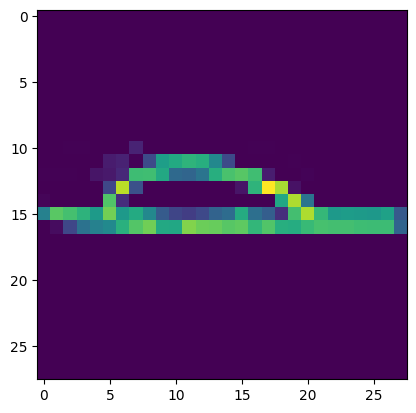

In [28]:
index = 1
sample_row = val_dataset.__getitem__(index)
sample=sample_row[0]
gt=sample_row[1]
plt.imshow(sample.squeeze());
print(sample.shape)
print(gt)

with torch.no_grad():
    out = model.forward(sample.view(1,1,28,28))
print(out)